# Advanced Lane Finding Project

In [1]:
### Setup and imports

import os

import cv2
import numpy as np
import matplotlib as mpl
from matplotlib import pyplot as plt
%matplotlib inline
mpl.rcParams['figure.dpi'] = 96

In [2]:
### Global functions

def plotImage (img, title=None, show_axis=False, cmap=None):
    plt.figure(figsize=(9,9))
    if title:         plt.title(title)
    if not show_axis: plt.axis('off')
    plt.imshow(img, interpolation='nearest', cmap=cmap)

### Camera Calibration

In [3]:
### Import calibration images

cal_images, cal_dir = [], os.getcwd() + '/camera_cal/'
for filename in ['calibration{}.jpg'.format(i) for i in range(1,21)]:
    img = cv2.imread(cal_dir + filename)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    cal_images.append((img, gray, filename))
    
print('{} calibration images imported.'.format(len(cal_images)))

20 calibration images imported.


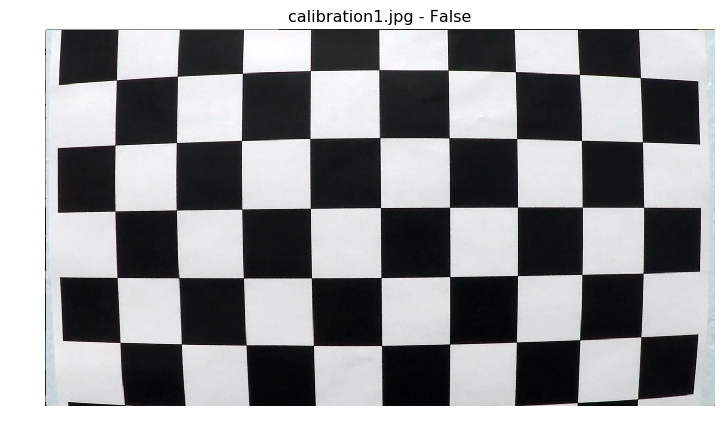

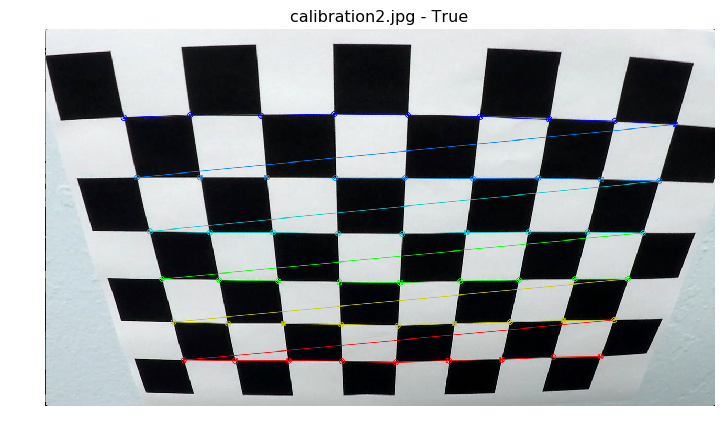

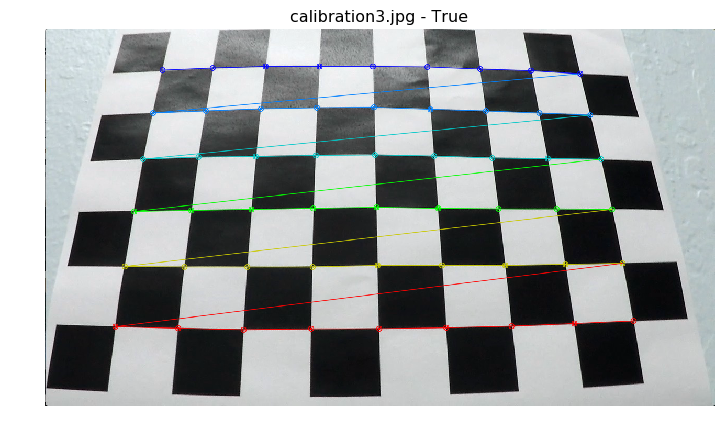

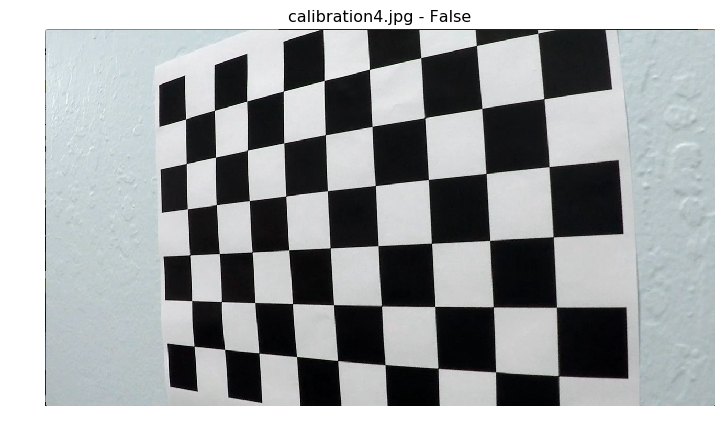

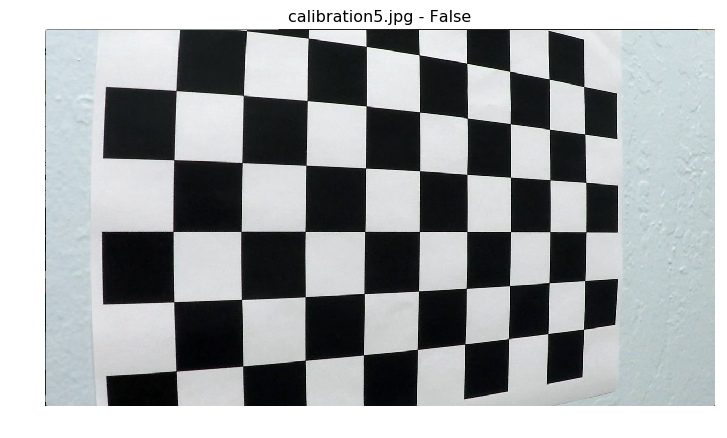

...

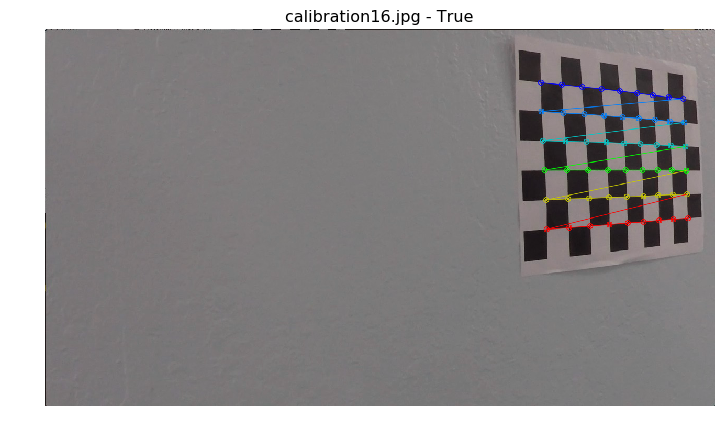

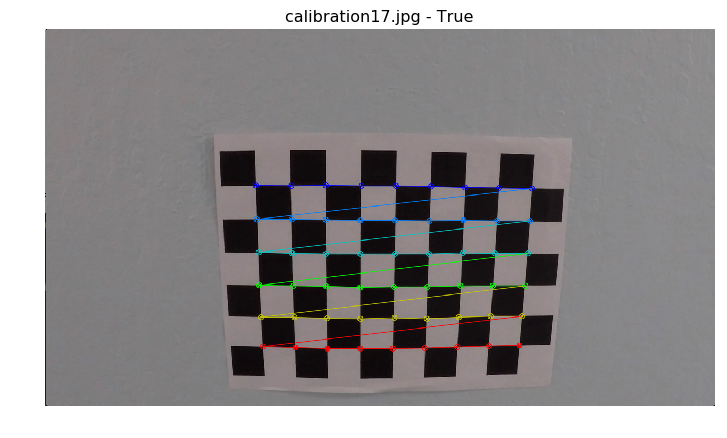

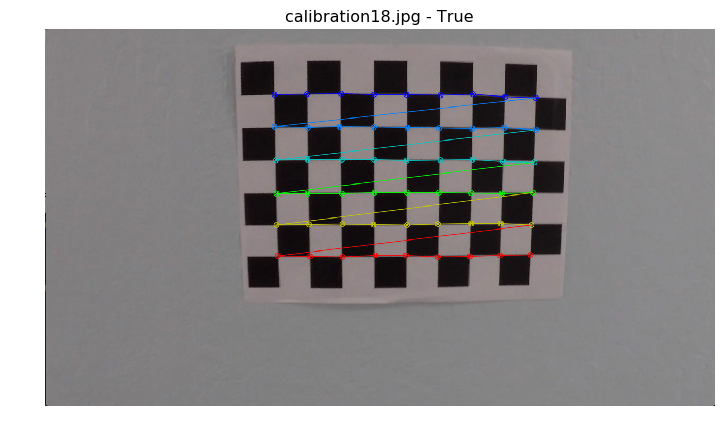

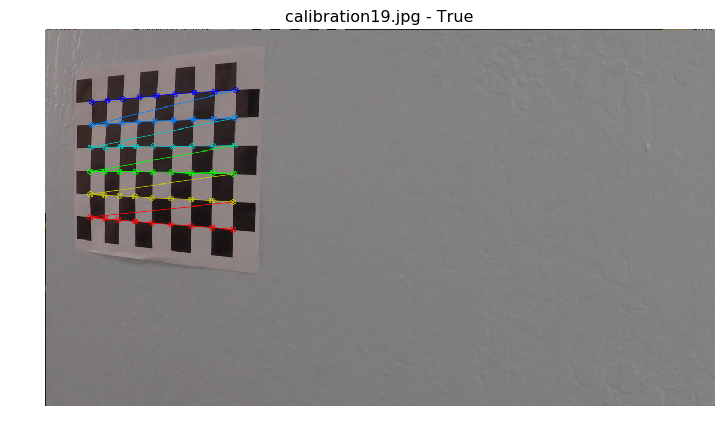

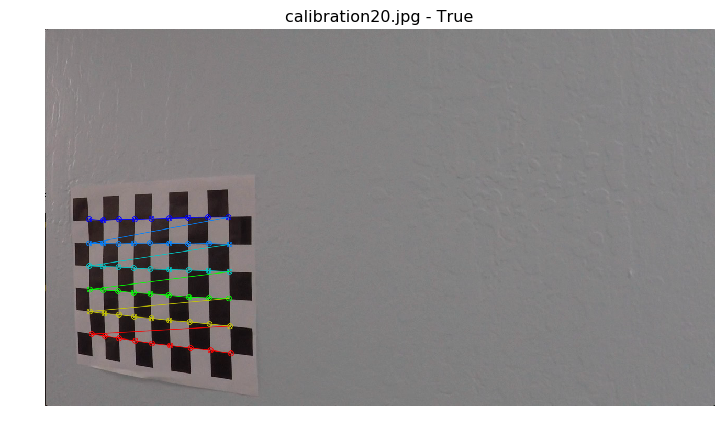

In [4]:
### Generate object and image points from chessboard images

num_corners = (9, 6) # (x, y) corners to look for in training images

objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image space

# Prepare object points
objp = np.zeros((9*6, 3), np.float32)
objp[:,:2] = np.mgrid[0:num_corners[0],0:num_corners[1]].T.reshape(-1,2)

# Generate image points and show detected corners
for img, gray, filename in cal_images:
    temp_img = img.copy()
    ret, corners = cv2.findChessboardCorners(gray, num_corners, None)
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(temp_img, num_corners, corners, ret)
        
    plotImage(temp_img, title='{} - {}'.format(filename, str(ret)))

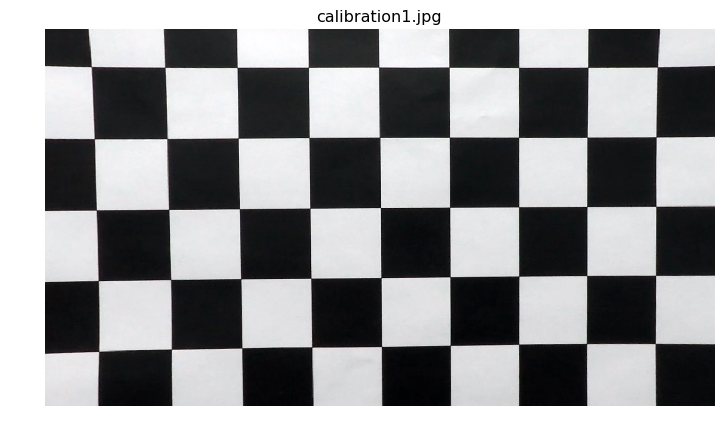

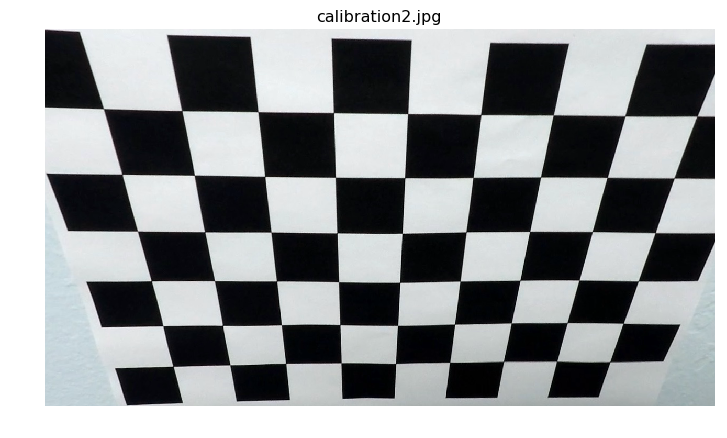

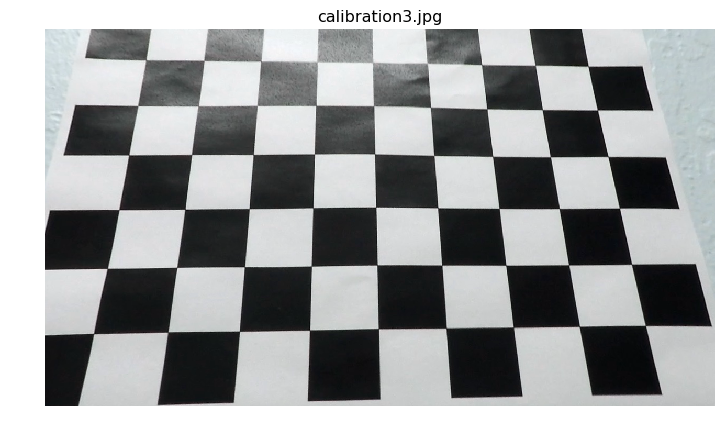

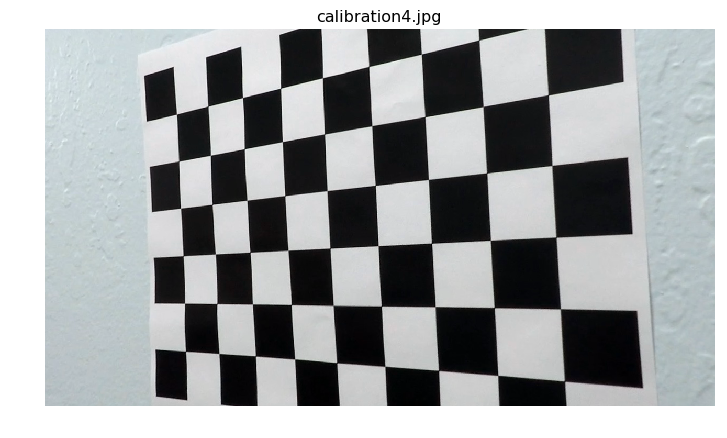

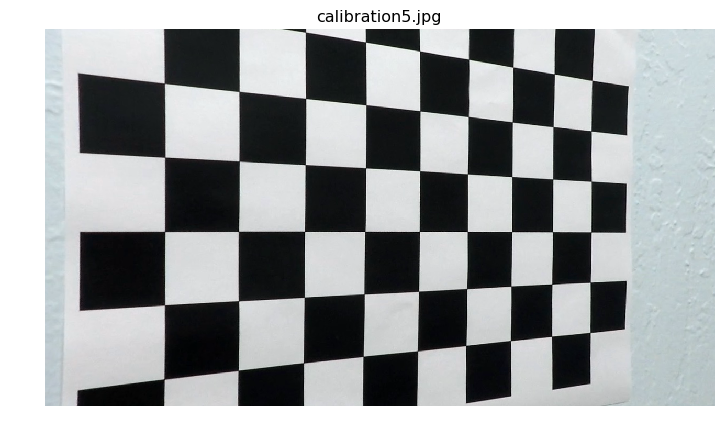

In [5]:
### Setup and test camera calibration

# Get calibration results
calibration = cv2.calibrateCamera(objpoints, imgpoints, gray.shape[::-1], None, None)

# Create undistort function
def undistort (img):
    mtx, dist = calibration[1:3]
    return cv2.undistort(img, mtx, dist, None, mtx)

# Show undistort results on calibration images
for img, gray, filename in cal_images[:5]: 
    plotImage(undistort(img), title=filename)

### Binary Threshold Pipeline

In [6]:
### Import test images with distortion correction and color space conversion

test_images, test_dir = [], os.getcwd() + '/test_images/'
for filename in os.listdir(test_dir):
    img = undistort(cv2.imread(test_dir + filename))
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    s_channel = cv2.cvtColor(img, cv2.COLOR_BGR2HLS)[:,:,2]
    test_images.append((img, gray, s_channel, filename))
    
print('{} test images imported.'.format(len(test_images)))

8 test images imported.


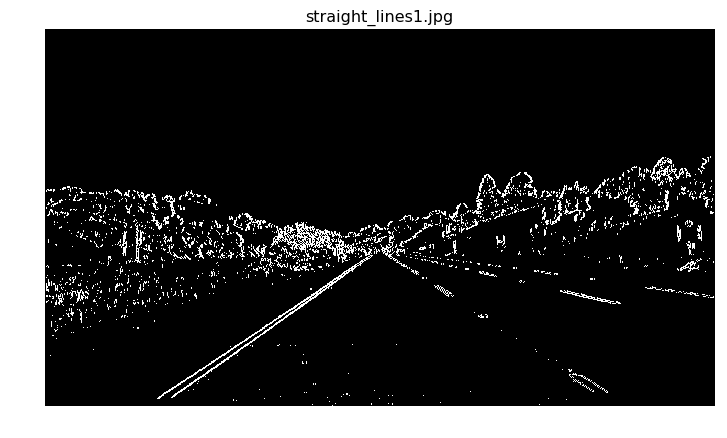

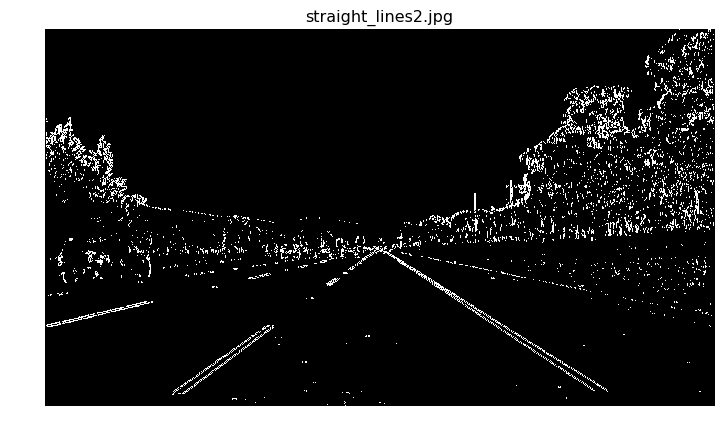

In [7]:
### Binary threshold by gradient

# Create Sobel x thresholding function
def gradientThreshold (gray, thresh_min=20, thresh_max=100):
    # Sobel x
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=3)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobel = np.uint8(abs_sobelx * (255 / np.max(abs_sobelx)))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
                            
    return sxbinary

# Test Sobel thresholds
for img, gray, s_channel, filename in test_images[0:2]:
    plotImage(gradientThreshold(gray), title=filename, cmap='gray')

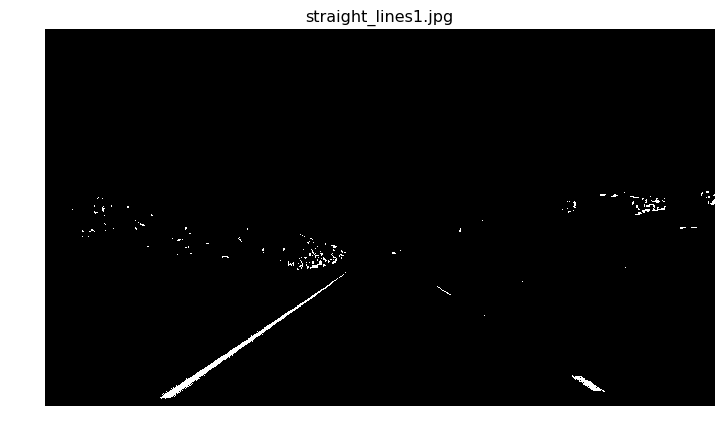

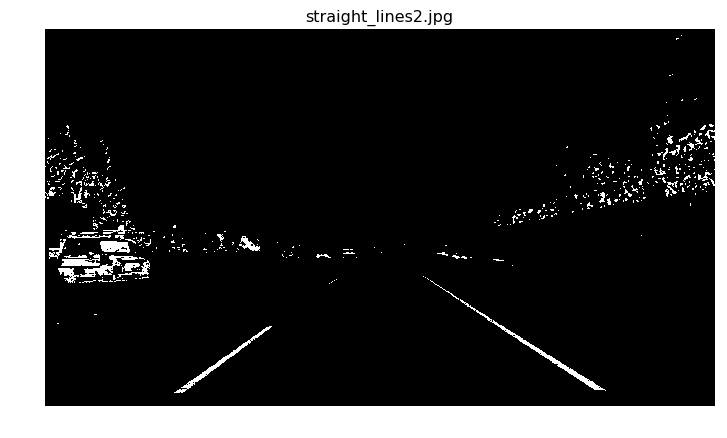

In [8]:
### Binary threshold by color channel

# Create S channel thresholding function
def colorThreshold (s_channel, thresh_min=170, thresh_max=255):
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= thresh_min) & (s_channel <= thresh_max)] = 1
    return s_binary
    
# Test color thresholds
for img, gray, s_channel, filename in test_images[0:2]:
    plotImage(colorThreshold(s_channel), title=filename, cmap='gray')

In [41]:
### Define thresholding function

def threshold (gray, s_channel):
    sobel_x, s_thresh = gradientThreshold(gray, *thresholds['sobel_x']), colorThreshold(s_channel, *thresholds['color'])
    combined_binary = np.zeros_like(sobel_x)
    combined_binary[(sobel_x == 1) | (s_thresh == 1)] = 1
    return sobel_x, s_thresh, combined_binary

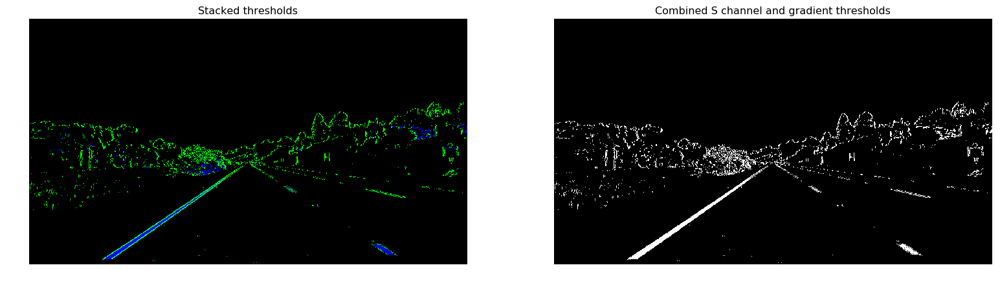

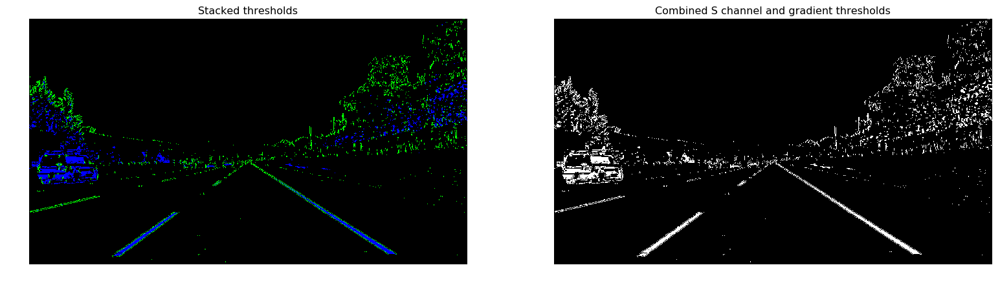

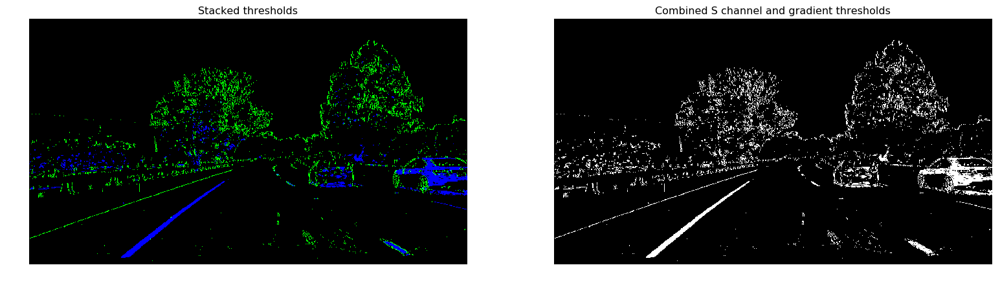

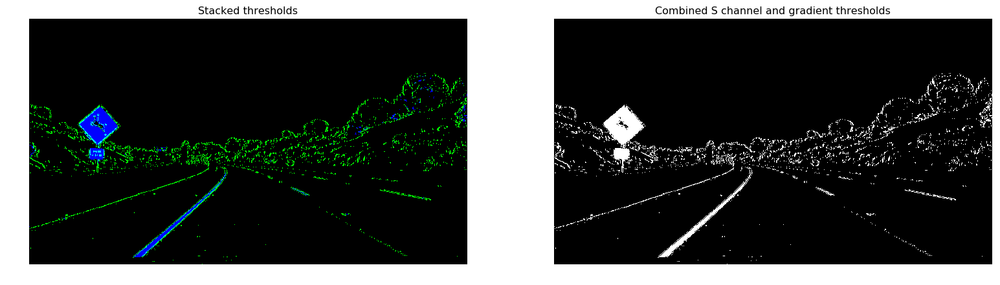

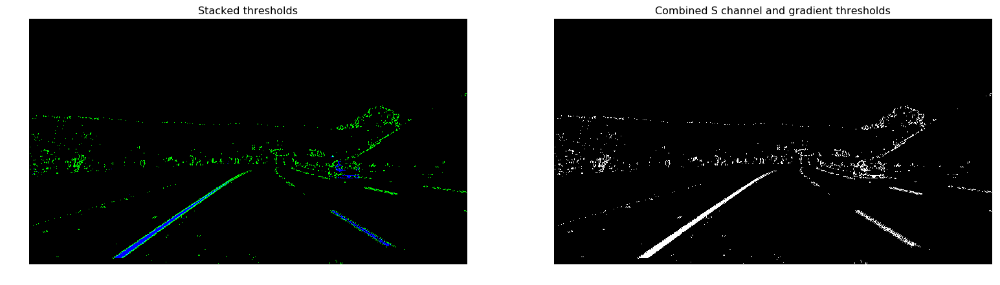

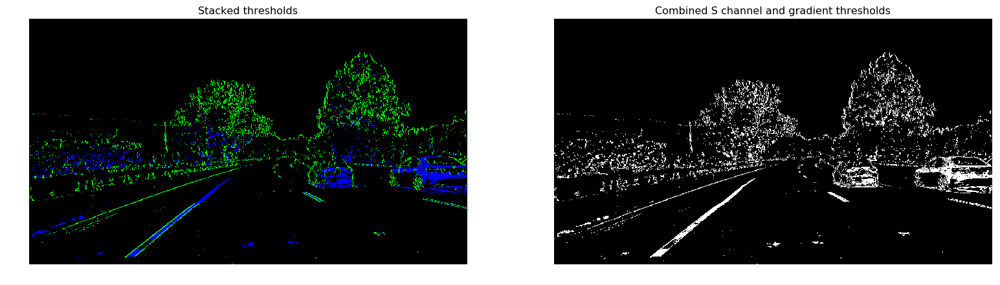

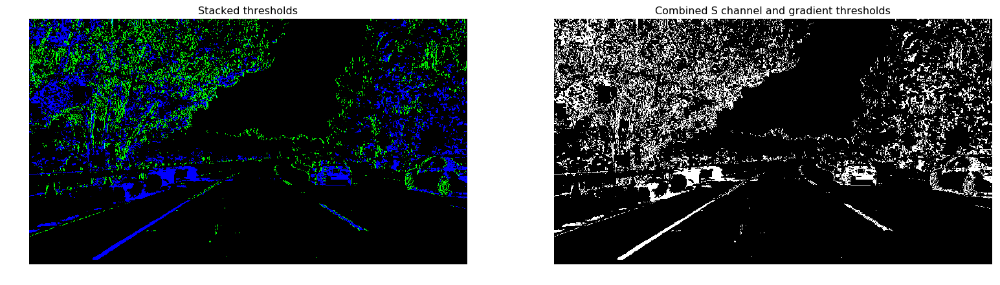

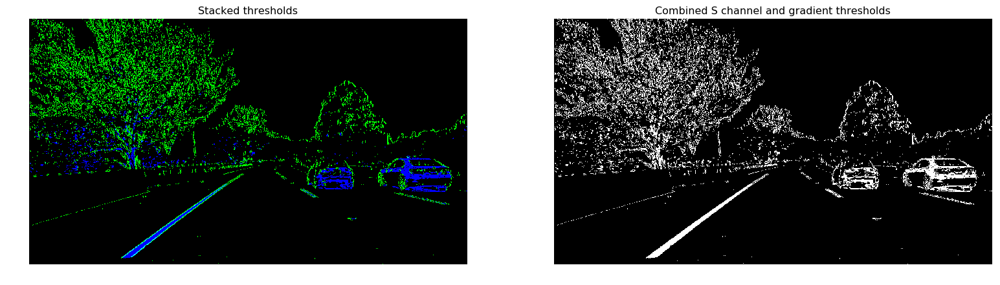

In [42]:
### Store and visualize thresholding results

thresholds = {'sobel_x': (30, 90), 'color': (170, 255)}

binary_images = []
for img, gray, s_channel, filename in test_images:
    sobel_x, s_thresh, combined_binary = threshold(gray, s_channel)
    binary_images.append(combined_binary)
    
    # Stack channels to see individual results (green == gradient, blue == color channel)
    color_binary = np.dstack((np.zeros_like(sobel_x), sobel_x, s_thresh)) * 255

    # Plot thresholded images
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.set_title('Stacked thresholds')
    ax1.axis('off')
    ax1.imshow(color_binary)

    ax2.set_title('Combined S channel and gradient thresholds')
    ax2.axis('off')
    ax2.imshow(combined_binary, cmap='gray')

### Perspective Transform Pipeline

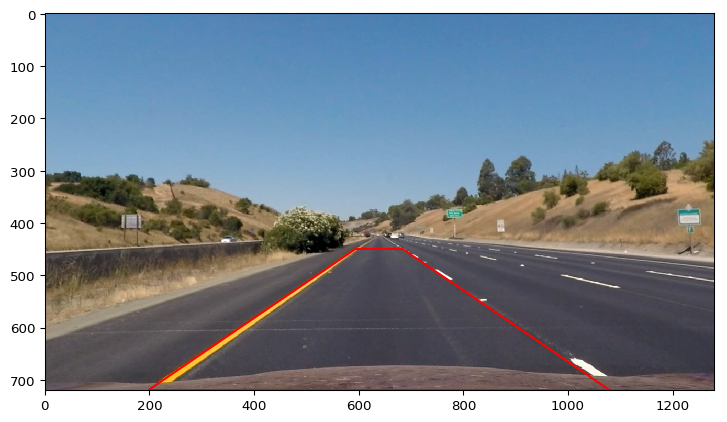

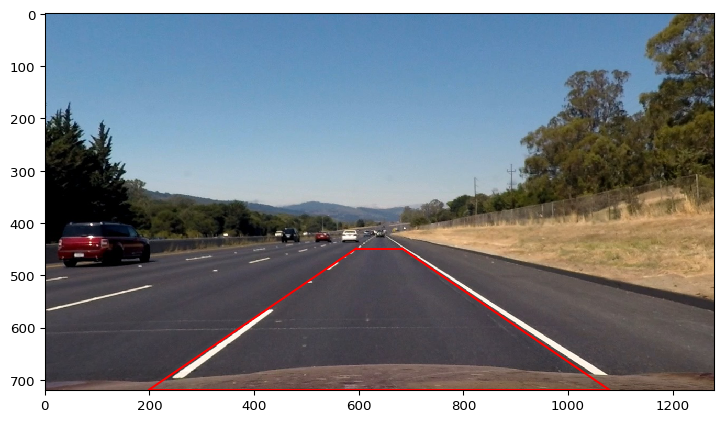

In [28]:
### Test transform points on straight road image

src_points = [[199, 719], [595, 449], [683, 449], [1079, 719]]

for img, _, __, ___ in test_images[:2]:
    plotImage(cv2.cvtColor(img, cv2.COLOR_BGR2RGB), show_axis=True)
    for i in range(-1,3):
        plt.plot(*zip(src_points[i], src_points[i+1]), 'r-')

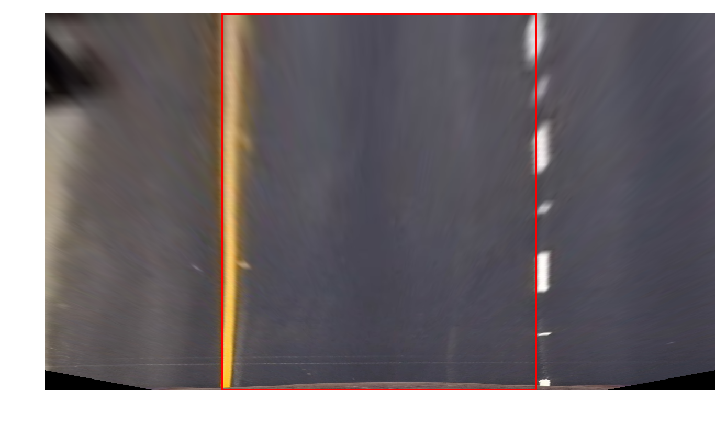

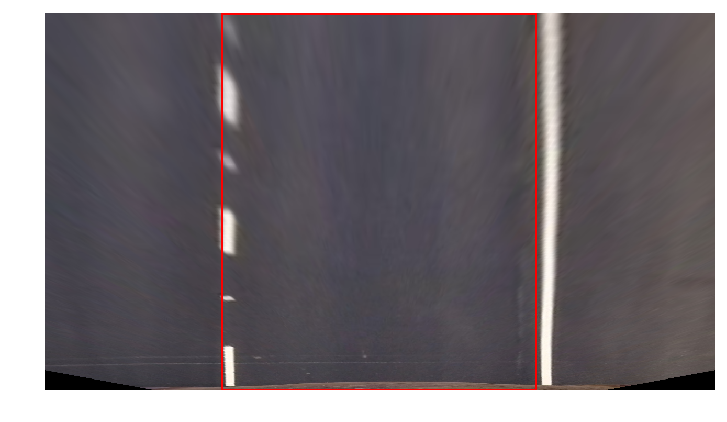

In [29]:
### Define and test perspective transform function

dst_points = [[339, 719], [339, 0], [939, 0], [939, 719]]

def warp (img, reverse=False):
    img_size = (img.shape[1], img.shape[0])
    src, dst = np.float32(src_points), np.float32(dst_points)
    M, M_inv = cv2.getPerspectiveTransform(src, dst), cv2.getPerspectiveTransform(dst, src)
    return cv2.warpPerspective(img, M_inv, img_size, flags=cv2.INTER_LINEAR) if reverse else cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

for img, _, __, ___ in test_images[:2]:
    plotImage(cv2.cvtColor(warp(img), cv2.COLOR_BGR2RGB))
    for i in range(-1,3):
        plt.plot(*zip(dst_points[i], dst_points[i+1]), 'r-')

### Lane Detection

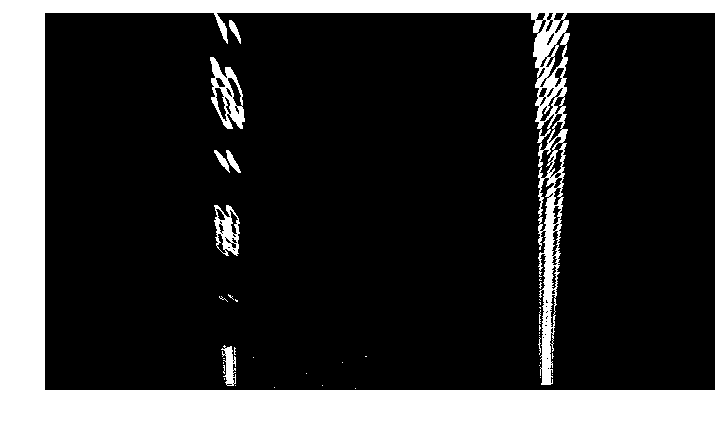

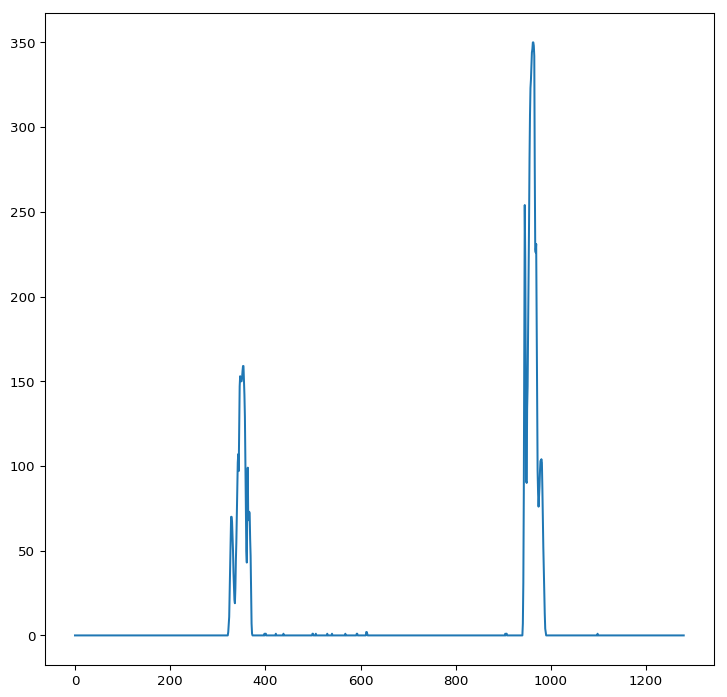

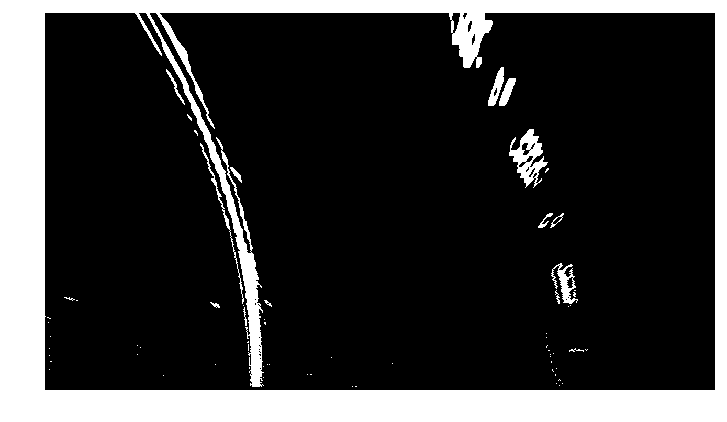

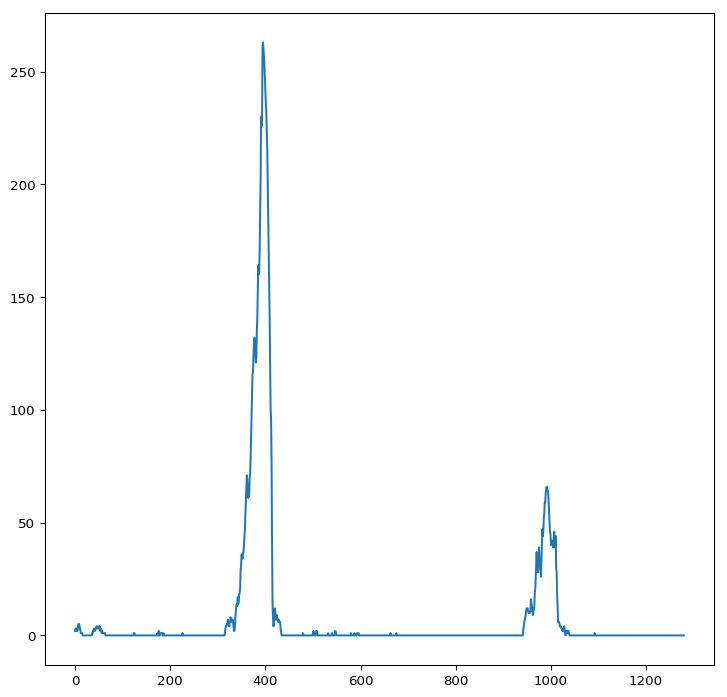

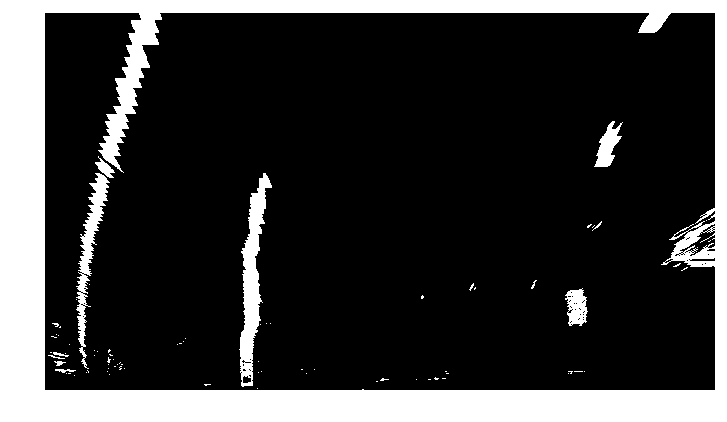

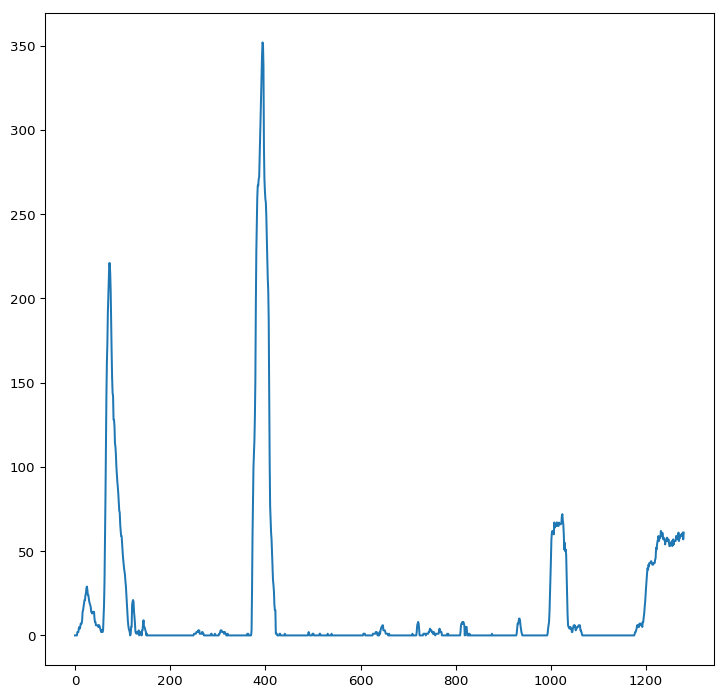

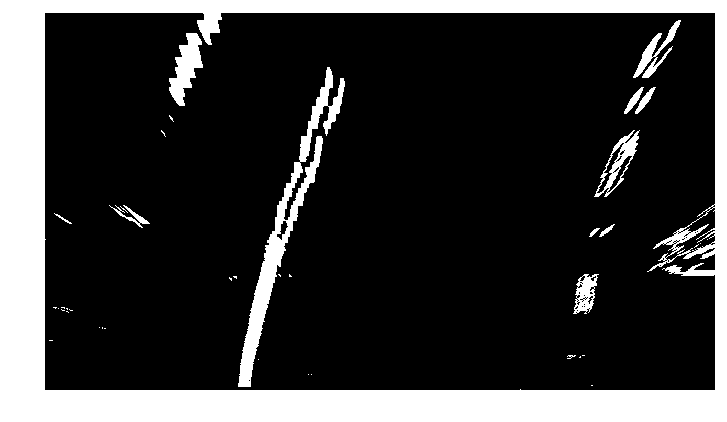

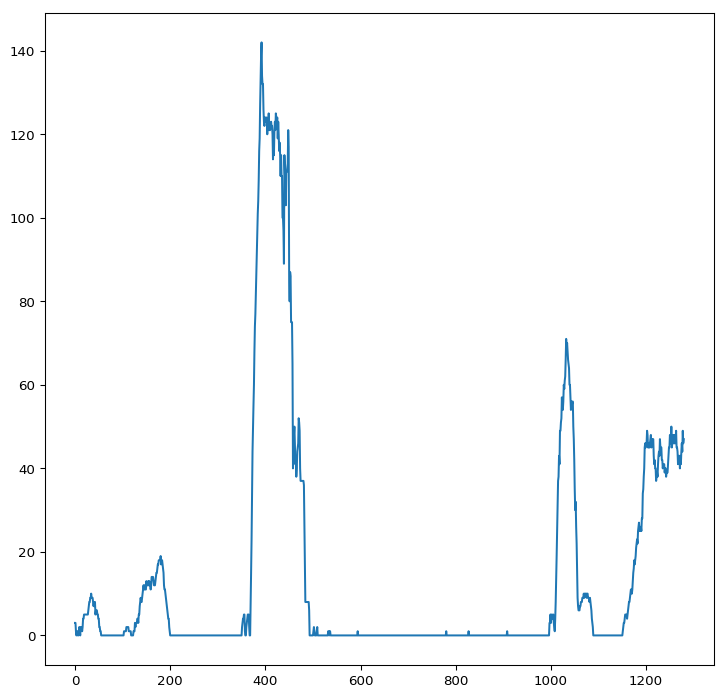

In [43]:
### Show pipeline processed images with histogram

warped_images = []
for i, img in enumerate(binary_images):
    warped = warp(img)
    histogram = np.sum(warped[warped.shape[0]//2:,:], axis=0)
    warped_images.append((warped, histogram))
    
    if i % 2 == 1:
        plotImage(warped, cmap='gray')
        plt.figure(figsize=(9,9))
        plt.plot(histogram)

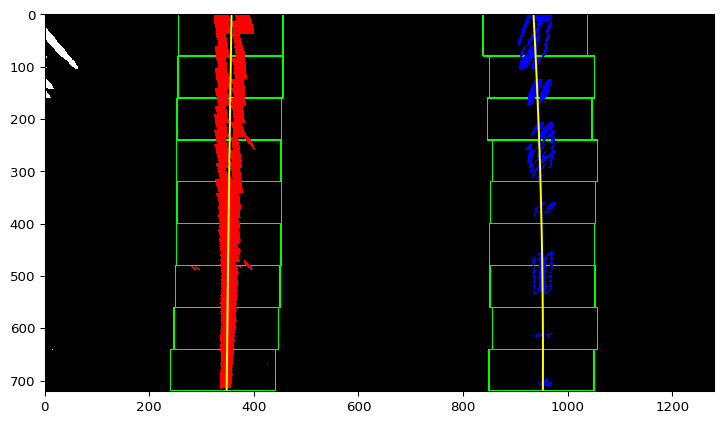

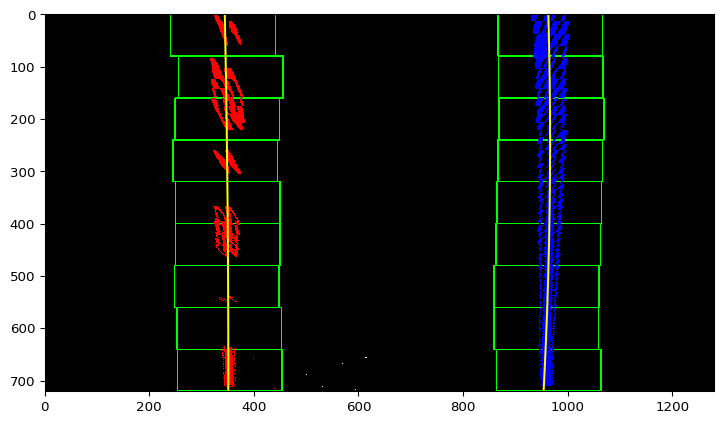

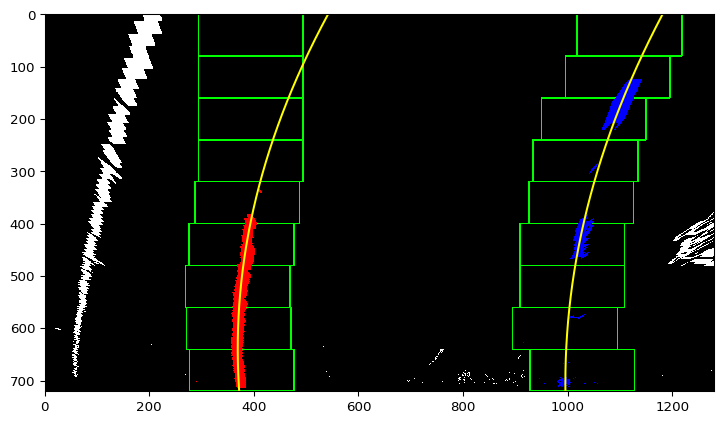

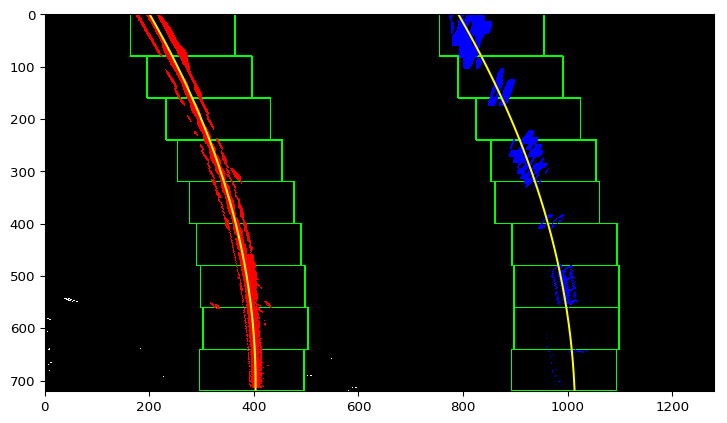

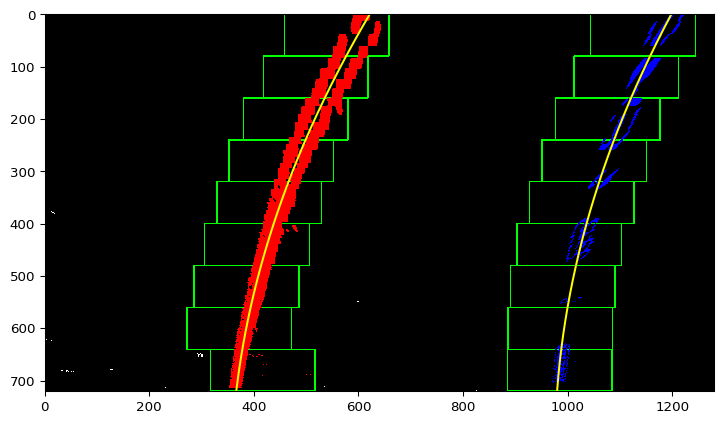

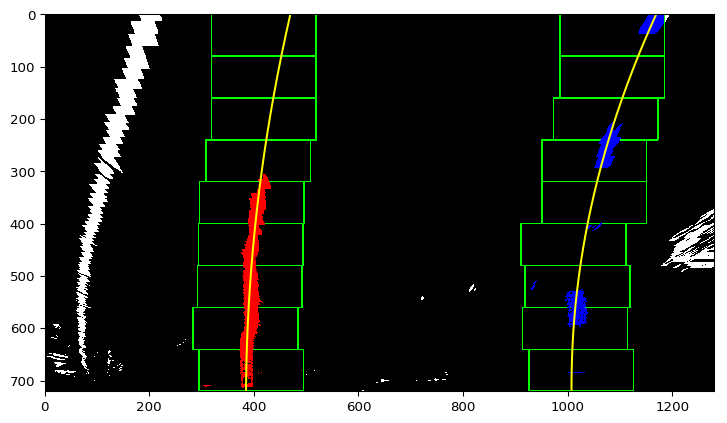

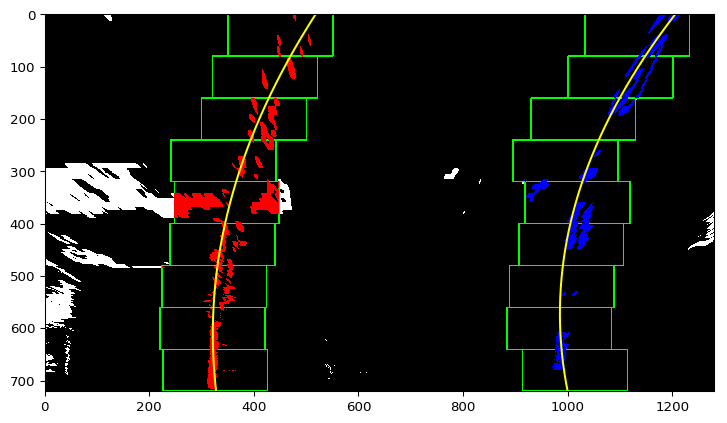

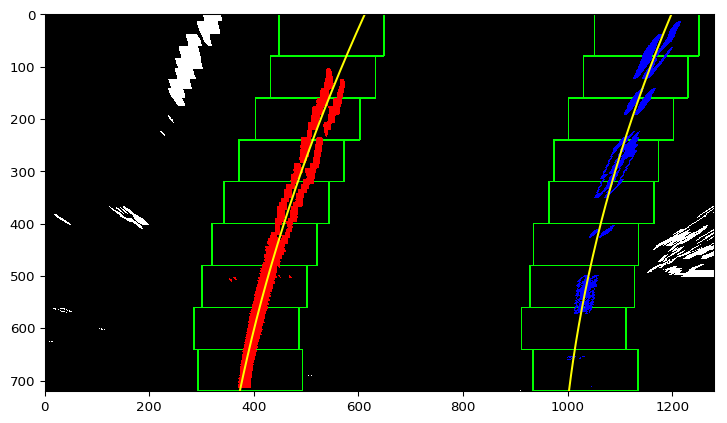

In [46]:
### Fit a polynomial via sliding windows

nwindows = 9  # number of sliding windows
margin = 100  # width of the windows +/- margin
minpix = 50   # minimum number of pixels found to recenter window

def polyFit (img, histogram, plot_result=False):
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((img, img, img))*255
    
    # Find the peak of the left and right halves of the histogram
    midpoint    = np.int(histogram.shape[0]/2)
    leftx_base  = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint
    
    # Set height of windows
    window_height = np.int(img.shape[0] / nwindows)
    
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    # Current positions to be updated for each window
    leftx_current  = leftx_base
    rightx_current = rightx_base
    
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds  = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low  = img.shape[0] - (window + 1) * window_height
        win_y_high = img.shape[0] - window * window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high), (0,255,0), 2) 
        cv2.rectangle(out_img,(win_xright_low,win_y_low),(win_xright_high,win_y_high), (0,255,0), 2)
        
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds  = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)

    # Extract left and right line pixel positions
    leftx  = nonzerox[left_lane_inds]
    lefty  = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 

    # Fit a second order polynomial to each
    left_fit  = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Plot the results
    if plot_result:
        ploty = np.linspace(0, img.shape[0] - 1, img.shape[0])
        left_fitx  = left_fit[0]  * ploty**2 + left_fit[1]  * ploty + left_fit[2]
        right_fitx = right_fit[0] * ploty**2 + right_fit[1] * ploty + right_fit[2]

        out_img[nonzeroy[left_lane_inds],  nonzerox[left_lane_inds]]  = [255, 0, 0]
        out_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
        plt.figure(figsize=(9,9))
        plt.imshow(out_img)
        plt.plot(left_fitx,  ploty, color='yellow')
        plt.plot(right_fitx, ploty, color='yellow')
        plt.xlim(0, 1280)
        plt.ylim(720, 0)
        
    return left_fit, right_fit
    
fit_lines = []
for img, histogram in warped_images:
    fit_lines.append(polyFit(img, histogram, True))

In [55]:
### Determine radius of curvature

height, width, _ = test_images[0][0].shape # image dimensions
ym_per_pix = 30  / height # meters per pixel in y dimension
xm_per_pix = 3.7 / width  # meters per pixel in x dimension

for (left_fit, right_fit) in fit_lines:
    # Calculate radii of curvature
    left_curverad  = ((1 + (2*left_fit[0]*height  + left_fit[1])**2) **1.5) / np.absolute(2*left_fit[0])
    right_curverad = ((1 + (2*right_fit[0]*height + right_fit[1])**2)**1.5) / np.absolute(2*right_fit[0])
    # print('Radii in pixel space: {03.f}, {03.f}'.format(left_curverad, right_curverad))
    
    # Fit new polynomials to x, y in world space
    left_fit_cr  = np.polyfit(left_fit*ym_per_pix,  leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(right_fit*ym_per_pix, rightx*xm_per_pix, 2)

    # Calculate new radii
    left_curverad  = ((1 + (2*left_fit_cr[0]*height*ym_per_pix  + left_fit_cr[1])**2)**1.5)  / np.absolute(2*left_fit_cr[0])
    right_curverad = ((1 + (2*right_fit_cr[0]*height*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
    # print('Radii in meters: {03.f}m, {03.f}m'.format(left_curverad, right_curverad))

TypeError: expected x and y to have same length